## In this part I've manually chosen 10 easy and 10 difficult images. 

In [1]:
#!pip install tqdm
#!pip install opencv-python
#!pip install matplotlib
#!pip install scipy
import mysql.connector as mysql
import database as db
import csv, sys
import image_generator
import feature_extractor
import numpy as np
import os
#os.environ["CUDA_VISIBLE_DEVICES"]="-1"    
#!unset CUDA_VISIBLE_DEVICES
import numpy as np
import cv2
import matplotlib.pyplot as plt
import math
from scipy import ndimage
from PIL import Image, ImageStat

In [2]:
myDB = db.connect_db("inference")

Easy images have very distinct object, clear background and are easy to classify in general. Difficult images have objects that blend with the background color, or images with low quality.

In [3]:
man_easy = [
'images/val/images/ILSVRC2012_val_00000013.JPEG',
    'images/val/images/ILSVRC2012_val_00000014.JPEG',
'images/val/images/ILSVRC2012_val_00000019.JPEG',
'images/val/images/ILSVRC2012_val_00000023.JPEG',
'images/val/images/ILSVRC2012_val_00000073.JPEG',
'images/val/images/ILSVRC2012_val_00000075.JPEG',
'images/val/images/ILSVRC2012_val_00000089.JPEG',
'images/val/images/ILSVRC2012_val_00000094.JPEG',
'images/val/images/ILSVRC2012_val_00000095.JPEG',
'images/val/images/ILSVRC2012_val_00000128.JPEG',
]

man_diff = [
'images/val/images/ILSVRC2012_val_00000011.JPEG',
'images/val/images/ILSVRC2012_val_00000016.JPEG',
'images/val/images/ILSVRC2012_val_00000021.JPEG',
'images/val/images/ILSVRC2012_val_00000068.JPEG',
'images/val/images/ILSVRC2012_val_00000083.JPEG',
'images/val/images/ILSVRC2012_val_00000087.JPEG',
'images/val/images/ILSVRC2012_val_00000090.JPEG',
'images/val/images/ILSVRC2012_val_00000100.JPEG',
'images/val/images/ILSVRC2012_val_00000126.JPEG',
'images/val/images/ILSVRC2012_val_00000127.JPEG',
]

Here you can see all easy images

images/val/images/ILSVRC2012_val_00000013.JPEG


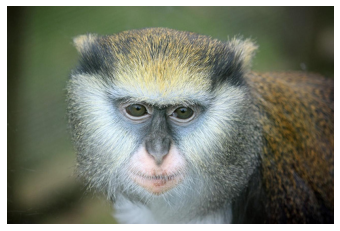

images/val/images/ILSVRC2012_val_00000014.JPEG


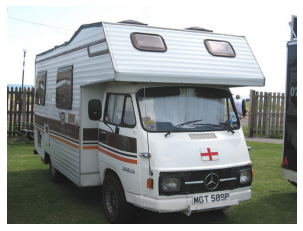

images/val/images/ILSVRC2012_val_00000019.JPEG


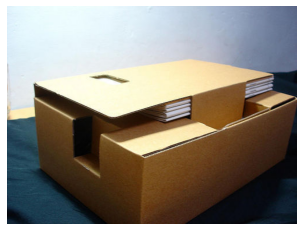

images/val/images/ILSVRC2012_val_00000023.JPEG


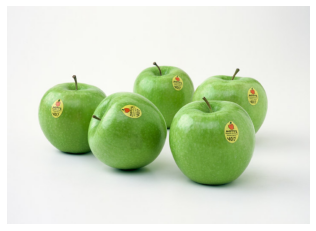

images/val/images/ILSVRC2012_val_00000073.JPEG


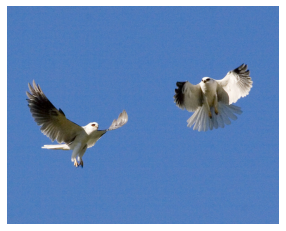

images/val/images/ILSVRC2012_val_00000075.JPEG


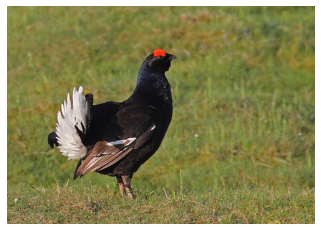

images/val/images/ILSVRC2012_val_00000089.JPEG


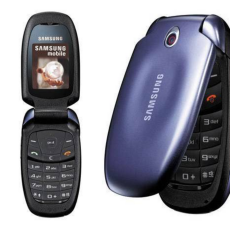

images/val/images/ILSVRC2012_val_00000094.JPEG


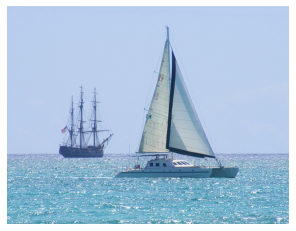

images/val/images/ILSVRC2012_val_00000095.JPEG


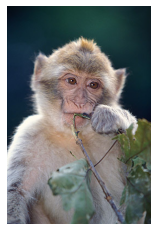

images/val/images/ILSVRC2012_val_00000128.JPEG


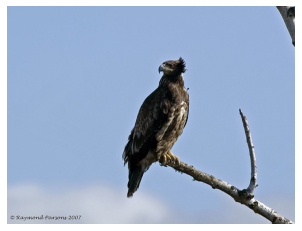

In [4]:
for x in man_easy:
    image = plt.imread(x)
    fig, ax = plt.subplots()
    im = ax.imshow(image)
    ax.axis('off')
    print(x)
    plt.show()

Here are all the images that I've considered to be difficult

images/val/images/ILSVRC2012_val_00000011.JPEG


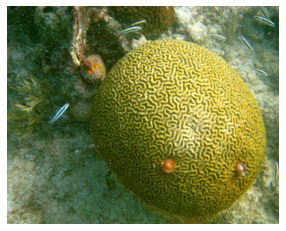

images/val/images/ILSVRC2012_val_00000016.JPEG


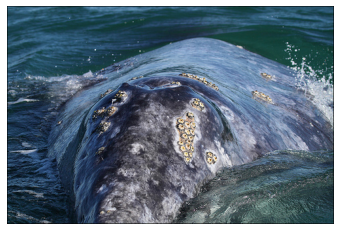

images/val/images/ILSVRC2012_val_00000021.JPEG


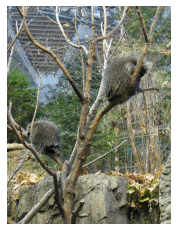

images/val/images/ILSVRC2012_val_00000068.JPEG


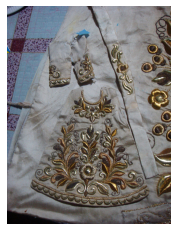

images/val/images/ILSVRC2012_val_00000083.JPEG


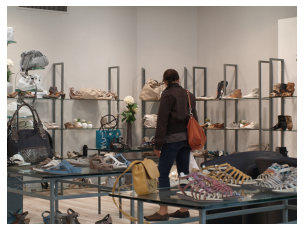

images/val/images/ILSVRC2012_val_00000087.JPEG


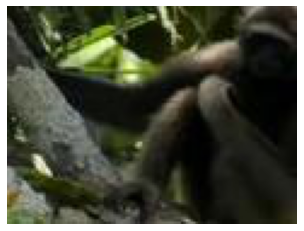

images/val/images/ILSVRC2012_val_00000090.JPEG


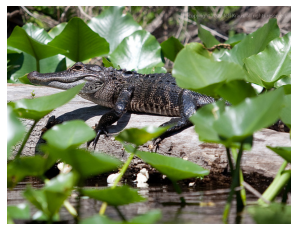

images/val/images/ILSVRC2012_val_00000100.JPEG


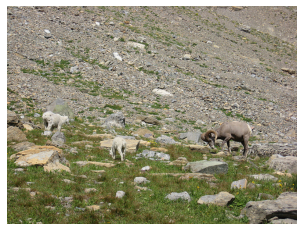

images/val/images/ILSVRC2012_val_00000126.JPEG


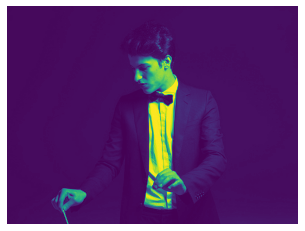

images/val/images/ILSVRC2012_val_00000127.JPEG


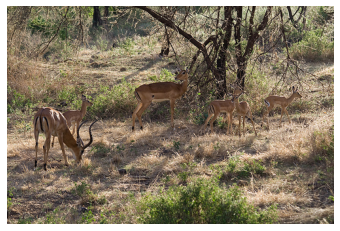

In [5]:
for x in man_diff:
    image = plt.imread(x)
    fig, ax = plt.subplots()
    im = ax.imshow(image)

    ax.axis('off')
    print(x)
    plt.show()

Here we extract features of each image, and plot a table for each category 

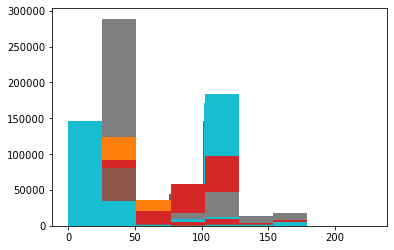

In [6]:
import plotly.graph_objects as go
easy_feat = []
diff_feat = []
print = []
names = [['# of Keypoints', 
          'Average of perceived brightness', 
          'Contrast', 
          'Area by Perimeter', 
          'Aspect ratio', 
          'Edge length 1', 
          'Hue 1']]
for x in man_easy:
    easy_feat.append(feature_extractor.extract_features(x))
    print.append(x[33:])
    
for x in range(len(easy_feat)):
    for y in range(len(easy_feat[x])):
        easy_feat[x][y] = round(easy_feat[x][y], 4)
fig = go.Figure(data=[go.Table(header=dict(values=['Image'] + names[0]),
                 cells=dict(values=[print] + list(map(list, zip(*easy_feat)))))
                     ])
fig.update_layout(width=1000, title="Easy Images")
fig.show()

print = []
for x in man_diff:
    diff_feat.append(feature_extractor.extract_features(x))
    print.append(x[33:])
    
for x in range(len(diff_feat)):
    for y in range(len(diff_feat[x])):
        diff_feat[x][y] = round(diff_feat[x][y], 4)
fig = go.Figure(data=[go.Table(header=dict(values=['Image'] + names[0]),
                 cells=dict(values=[print] + list(map(list, zip(*diff_feat)))))
                     ])
fig.update_layout(width=1000, title="Difficult Images")
fig.show()


In [7]:
av_easy = []
for x in range(len(easy_feat[0])):
    sum = 0
    for y in range(len(easy_feat)):
        sum += easy_feat[y][x]
    av_easy.append(round(sum/len(easy_feat), 4))
    
av_diff = []
for x in range(len(diff_feat[0])):
    sum = 0
    for y in range(len(diff_feat)):
        sum += diff_feat[y][x]
    av_diff.append(round(sum/len(diff_feat), 4))

a = [av_easy, av_diff]
temp = []
temp.append(['Easy', 'Difficult'])
fig = go.Figure(data=[go.Table(header=dict(values=['Image'] + names[0]),
                 cells=dict(values=temp + list(map(list, zip(*a)))))
                     ])
fig.update_layout(width=1000, title="Average Values")
fig.show()

# This is the end of a main part. Below I conduct several tests to find the correlation between images and obtained results

### Number of Keypoints

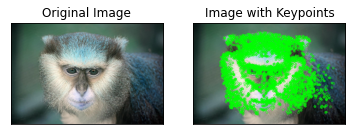

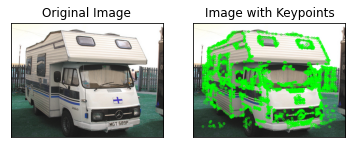

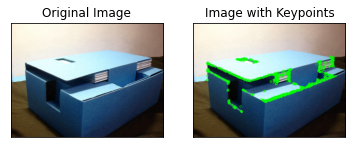

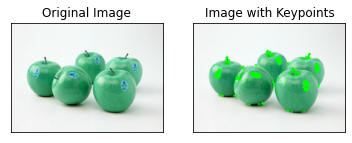

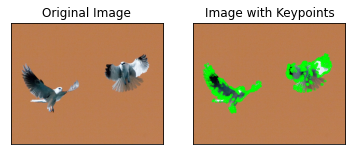

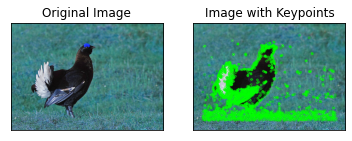

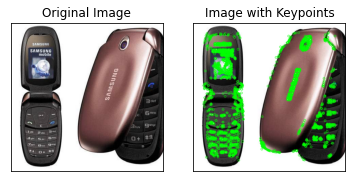

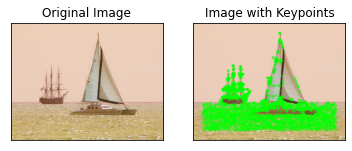

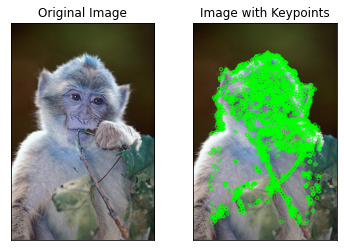

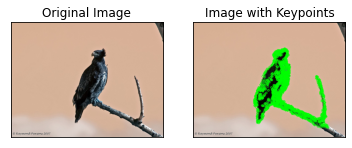

In [16]:
"""Opens images in a new window"""
orb = cv2.ORB_create(nfeatures = 10000) 
for x in range(len(man_easy)):
    img = cv2.imread(man_easy[x], 3)
    keypoints, descriptors = orb.detectAndCompute(img, None)
    img2 = cv2.drawKeypoints(img, keypoints, None, color=(0,255,0), flags=0)
    plt.subplot(121),plt.imshow(img,cmap = 'gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img2,cmap = 'gray')
    plt.title('Image with Keypoints'), plt.xticks([]), plt.yticks([])
    plt.show()
#     plt.show()
#     cv2.imshow('Image',img2)
#     cv2.waitKey(0)
#     cv2.destroyAllWindows()

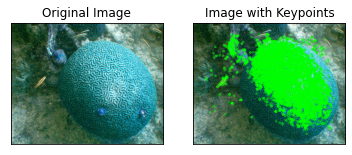

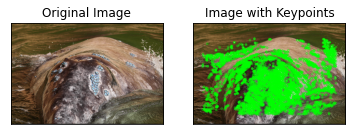

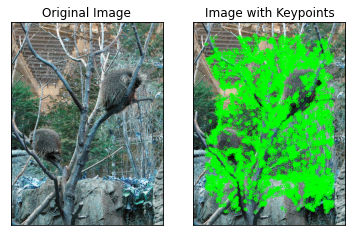

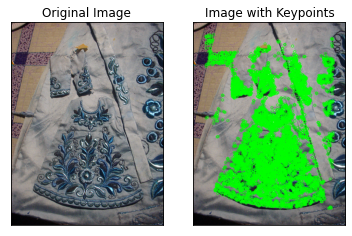

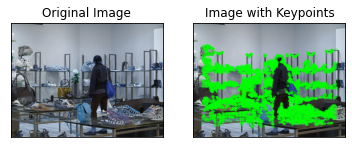

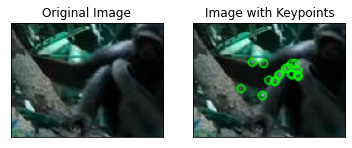

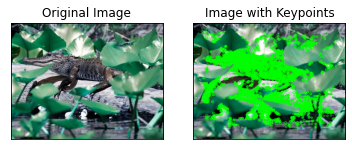

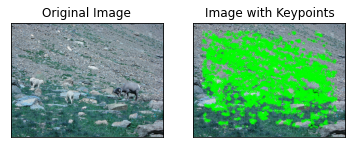

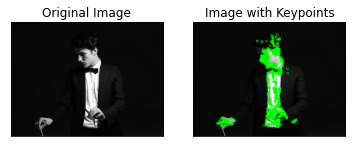

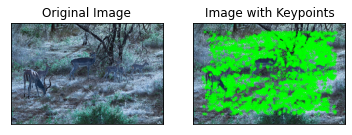

In [17]:
for x in range(len(man_diff)):
    img = cv2.imread(man_diff[x], 3)
    keypoints, descriptors = orb.detectAndCompute(img, None)
    img2 = cv2.drawKeypoints(img, keypoints, None, color=(0,255,0), flags=0)
    plt.subplot(121),plt.imshow(img,cmap = 'gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(img2,cmap = 'gray')
    plt.title('Image with Keypoints'), plt.xticks([]), plt.yticks([])
    plt.show()

### Edges

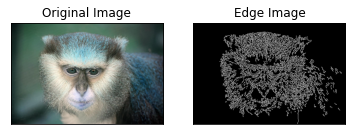

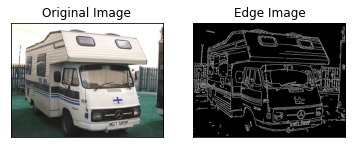

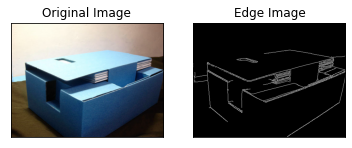

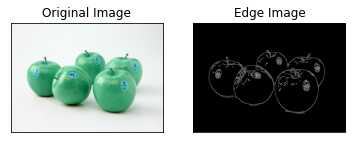

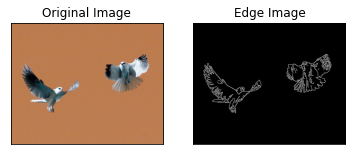

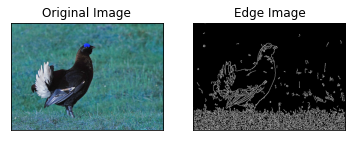

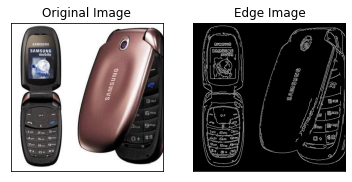

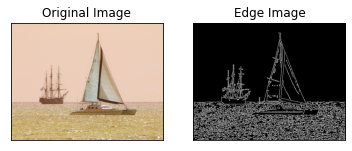

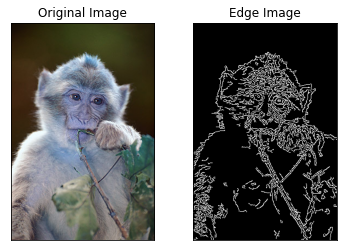

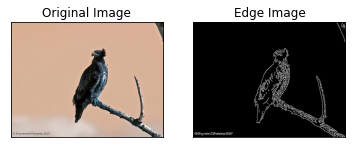

In [10]:
for x in range(len(man_easy)):
    img = cv2.imread(man_easy[x], 3)
    edges = cv2.Canny(img, 100, 200)
    threshold = 100
    labeled, nr_objects = ndimage.label(edges > threshold) 
    unique, lengths = np.unique(labeled, return_counts=True)
    y, x, g = plt.hist(lengths[1:], bins = 7)
    y_min = np.where(y == y.min())[0][0]
    x_min = np.mean((x[y_min:y_min + 2]))
    y_max = np.where(y == y.max())[0][0]
    x_max = np.mean((x[y_max:y_max + 2]))
    edge_length1 = ((x_max * y.max()) + (x_min * y.min())) / (y.max() + y.min())           # edge length

    plt.subplot(121),plt.imshow(img,cmap = 'gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(edges,cmap = 'gray')
    plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
    plt.show()

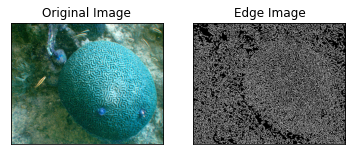

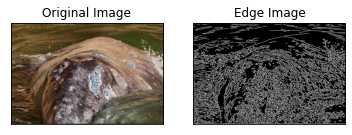

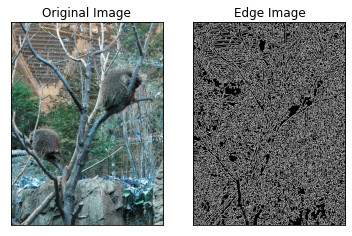

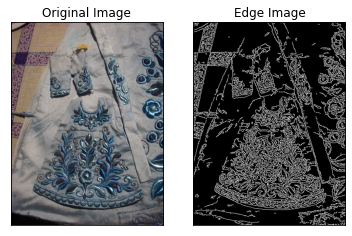

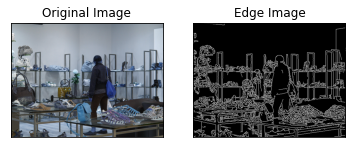

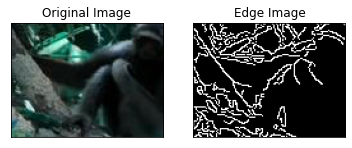

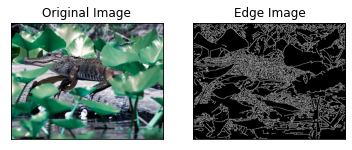

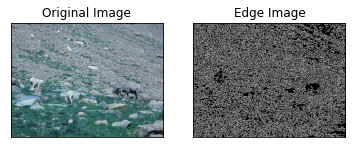

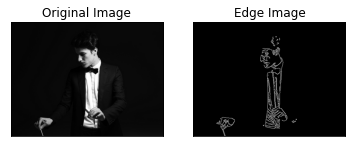

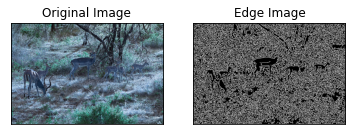

In [11]:
for x in range(len(man_diff)):
    img = cv2.imread(man_diff[x], 3)
    edges = cv2.Canny(img, 100, 200)
    threshold = 100
    labeled, nr_objects = ndimage.label(edges > threshold) 
    unique, lengths = np.unique(labeled, return_counts=True)
    y, x, g = plt.hist(lengths[1:], bins = 7)
    y_min = np.where(y == y.min())[0][0]
    x_min = np.mean((x[y_min:y_min + 2]))
    y_max = np.where(y == y.max())[0][0]
    x_max = np.mean((x[y_max:y_max + 2]))
    edge_length1 = ((x_max * y.max()) + (x_min * y.min())) / (y.max() + y.min())           # edge length

    plt.subplot(121),plt.imshow(img,cmap = 'gray')
    plt.title('Original Image'), plt.xticks([]), plt.yticks([])
    plt.subplot(122),plt.imshow(edges,cmap = 'gray')
    plt.title('Edge Image'), plt.xticks([]), plt.yticks([])
    plt.show()